In [1]:
import pressure_img_generation
from importlib import reload
import matplotlib.pyplot as plt
import output_display
import wave_propagation
import math
import tensorflow as tf
import numpy as np

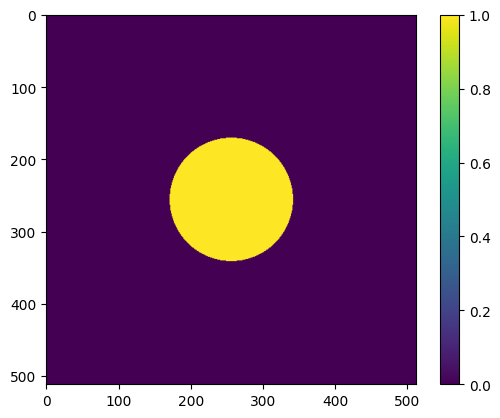

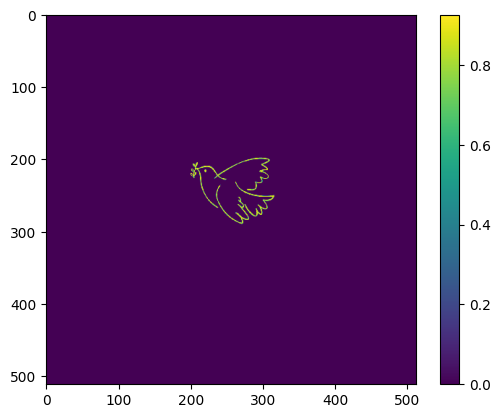

In [2]:
reload(pressure_img_generation)
reload(output_display)

#f0=1.15e6
#c0=1900
f0 = 2.06e06
c0 = 1481
k = 2*math.pi*f0/c0
N = 512
#R=9.5e-3
R = 25*1e-3
L = 6*R
dx = L/N
z = 30*1e-3
#z=1e-3

##### Target Amplitude #####
p_target_amp = pressure_img_generation.img_to_matrix("birdie_small.png",512)

##### Input #####
p_0_amp = pressure_img_generation.circle_matrix(N,R/dx)


# convert to correct datatype
p_0_amp = tf.dtypes.cast(p_0_amp, tf.complex128)
p_target_amp = tf.dtypes.cast(p_target_amp, tf.complex128)


output_display.draw_pressure_complex(p_0_amp)
output_display.draw_pressure_complex(p_target_amp)



In [3]:
reload(wave_propagation)
H_up = wave_propagation.band_limited_propagator(k, N, z, dx)
phasemap = wave_propagation.iasa(p_0_amp,p_target_amp,H_up)

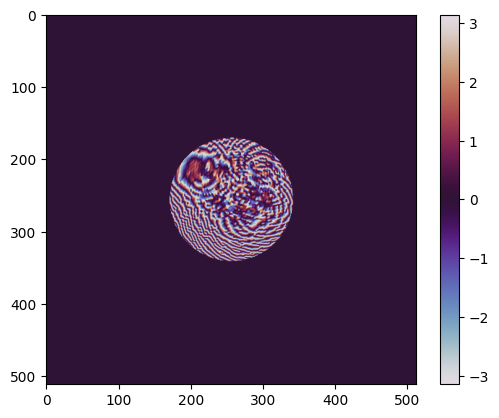

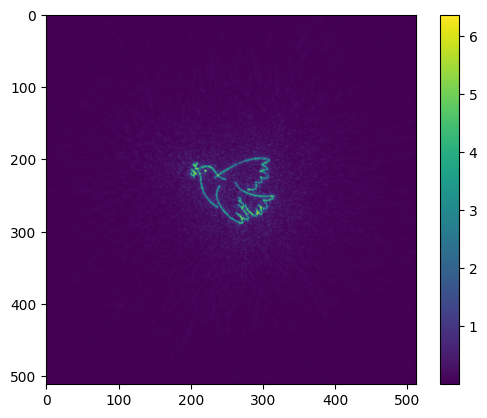

In [4]:
reload(output_display)
p_hologram = p_0_amp*np.exp(1j*phasemap)
p_image = wave_propagation.propagate(p_hologram,H_up)
output_display.draw_phase(phasemap)
output_display.draw_pressure_complex(p_image)

In [6]:
# c1 > c2

#c1 = 2200 # PLA
c1 = 2500 # vero ultra resin
#c2 = 936 # easyflo 90
c2 = c0
f = 1.15e6


H = 1/f/(1/c2-1/c1) # max height of hologram
delta_z = (phasemap % (2*np.pi)) / (2*np.pi*f*(1/c2-1/c1))

h1 = H-delta_z

h1[p_0_amp==0]=0

x_values = np.arange(0,N*dx,dx)
y_values = np.arange(0,N*dx,dx)
input_map = p_0_amp.numpy().ravel()

print(H)
mesh1 = output_display.heightmap_to_mesh(h1,input_map,x_values,y_values)
mesh1.show()

0.003159534070060161


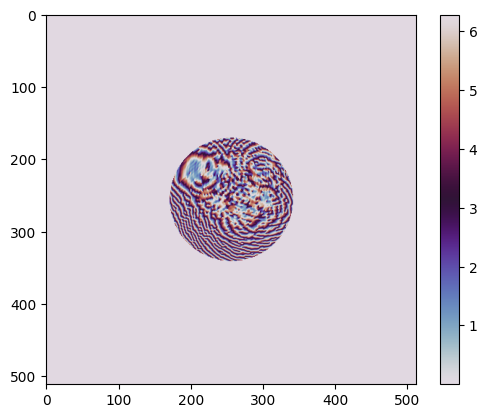

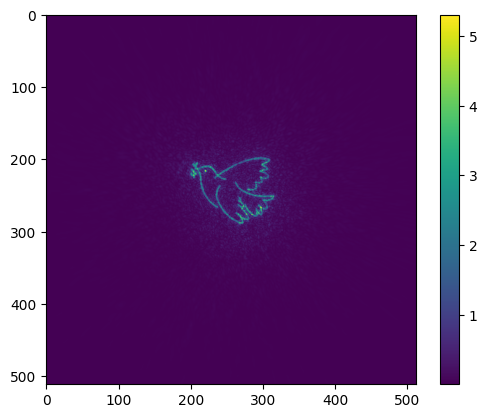

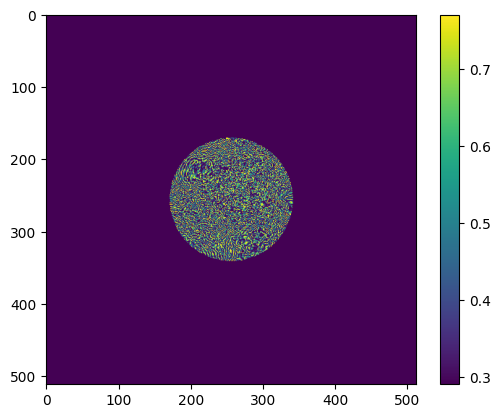

In [8]:
reload(output_display)
reload(wave_propagation)
# replace easyflo (c2) with glycerol (c0)
# or water (c_H2O)
c_H2O = 1481 # at 20C
c_fluid = c0
test_phase_map = (H-h1) * 2*np.pi*f*(1/c_fluid-1/c1)

kh = 2*math.pi*f0/c1
alpha_T = wave_propagation.transmission_coefficient(17.28e6,3e6,1.48e6,kh,h1)
#alpha_T = np.ones(h1.shape)


z_up=z
H_up = wave_propagation.band_limited_propagator(k, N, z_up, dx)
p_test_holo = p_0_amp*np.exp(1j*test_phase_map)
p_test_image = np.sqrt(alpha_T)*wave_propagation.propagate(p_test_holo,H_up)
output_display.draw_phase(test_phase_map)
output_display.draw_pressure_complex(p_test_image)
output_display.draw_pressure_amplitude(alpha_T)



